# Assignment 2.3: Traffic Sign Detection

Student Name 1: Mateusz Klimas

Student Name 2: Jorge Martín Lasaosa

Student Name 3: Juan Luis Ruiz-Tagle Oriol

Download full data set from http://www.dia.fi.upm.es/~lbaumela/FullIJCNN2013.zip

In [2]:
!wget -c http://www.dia.fi.upm.es/~lbaumela/FullIJCNN2013.zip
!unzip FullIJCNN2013.zip

--2020-03-23 18:57:46--  http://www.dia.fi.upm.es/~lbaumela/FullIJCNN2013.zip
Resolving www.dia.fi.upm.es (www.dia.fi.upm.es)... 138.100.11.29
Connecting to www.dia.fi.upm.es (www.dia.fi.upm.es)|138.100.11.29|:80... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  FullIJCNN2013.zip
replace FullIJCNN2013/00000.ppm? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [5]:
!pip install opencv-python
import numpy as np
import cv2

IMG_HEIGHT = 600
SIGN_SIZE = (224, 224)

# Function for reading the images
def readImages(rootpath, images_range, signs_range):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.
    Arguments: path to the traffic sign data, for example 'FullIJCNN2013'
    Returns:   list of images, list of corresponding labels'''
    images = {} # original image
    scales = {} # original scale
    for num in images_range:
        filename = rootpath + '/' + "{:05d}".format(num) + '.ppm'
        img = cv2.imread(filename, cv2.IMREAD_COLOR)
        scale = IMG_HEIGHT / float(img.shape[0])
        img_resized = cv2.resize(img, (int(img.shape[1]*scale),int(img.shape[0]*scale)))
        images.setdefault(filename,[]).append(img_resized)
        scales.setdefault(filename,[]).append(scale)

    files = [] # filenames
    signs = [] # traffic sign image
    bboxes = [] # corresponding box detection
    labels = [] # traffic sign type
    data = np.genfromtxt(rootpath + '/' + 'gt.txt', delimiter=';', dtype=str, usecols=range(0, 6))
    for elem in signs_range:
        filename = rootpath + '/' + data[elem][0]
        img = images.get(filename)[0]
        scale = scales.get(filename)[0]
        bbox = np.array([int(data[elem][1]), int(data[elem][2]), int(data[elem][3]), int(data[elem][4])]) * scale
        sign = img[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
        sign_resized = cv2.resize(sign, SIGN_SIZE)
        files.append(filename)
        signs.append(sign_resized)
        bboxes.append(bbox)
        labels.append(data[elem][5])
    return images, files, signs, bboxes, labels

You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [6]:
# The German Traffic Sign Recognition Benchmark
train_images, train_files, train_signs, train_bboxes, train_labels = readImages('FullIJCNN2013', range(0,600), range(0,852))
test_images, test_files, test_signs, test_bboxes, test_labels = readImages('FullIJCNN2013', range(600,900), range(852,1213))

You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


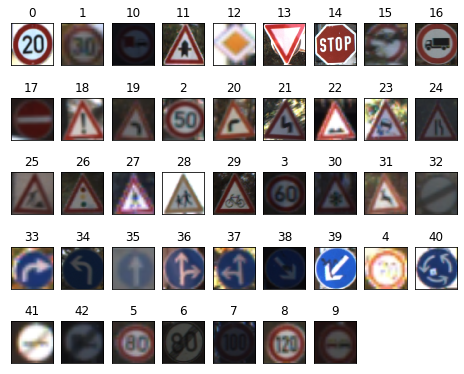

In [10]:
!pip install matplotlib

import matplotlib.pyplot as plt
%matplotlib inline 

# Show examples from each class
class_names = np.unique(train_labels)
num_classes = len(class_names)
fig = plt.figure(figsize=(8,8))
for i in range(num_classes):
    ax = fig.add_subplot(6, 9, 1 + i, xticks=[], yticks=[])
    ax.set_title(class_names[i])
    indices = np.where(np.isin(train_labels, class_names[i]))[0]
    plt.imshow(cv2.cvtColor(train_signs[int(np.random.choice(indices, 1))], cv2.COLOR_BGR2RGB))
plt.show()

In [11]:
!pip install sklearn

from sklearn.utils import shuffle
from tensorflow.keras.utils import to_categorical

train_files, train_signs, train_bboxes, train_labels = shuffle(train_files, train_signs, train_bboxes, train_labels)
# plt.imshow(cv2.cvtColor(train_images.get(train_files[0])[0], cv2.COLOR_BGR2RGB))
# plt.show()
# plt.imshow(cv2.cvtColor(train_signs[0], cv2.COLOR_BGR2RGB))
# plt.show()
# print(train_bboxes[0])
# print(train_labels[0])

# Data pre-processing
tr_signs = np.array(train_signs)[0:600]
tr_labels = np.array(train_labels)[0:600]
va_signs = np.array(train_signs)[600:852]
va_labels = np.array(train_labels)[600:852]
te_signs = np.array(test_signs)
te_labels = np.array(test_labels)

tr_signs = tr_signs.astype('float32')
va_signs = va_signs.astype('float32')
te_signs = te_signs.astype('float32')
tr_signs /= 255.0
va_signs /= 255.0
te_signs /= 255.0

tr_labels = to_categorical(tr_labels, num_classes)
va_labels = to_categorical(va_labels, num_classes)
te_labels = to_categorical(te_labels, num_classes)

You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


# Assignment 3.4: Traffic sign detection

First of all pre present an implementation of Faster-RCNN from:

> S. Ren, K. He, R. Girshick and J. Sun, "Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks," in IEEE Transactions on Pattern Analysis and Machine Intelligence, vol. 39, no. 6, pp. 1137-1149, 1 June 2017.

The implementation uses as backbone the ResNet. We provide the pre-trained weights of both, the backbone and the region proposal network.

In [12]:
ANCHOR_RATIOS = (0.5, 1.0, 2.0)
ANCHOR_STRIDE = 16
ANCHOR_SIZES = (32, 64, 128, 256, 512)
MAX_SIZE = 1344
MIN_SIZE = 0

# Parameters to play with to modify the number of proposal in each image
TEST_PRE_NMS_TOPK = 8000 # The maximum number of positive samples taken during proposal generation, pre NMS
TEST_POST_NMS_TOPK = 1000 # The maximum number of positive samples taken during proposal generation, post NMS
PROPOSAL_NMS_THRESH = 0.7

In [13]:
"""Operations for [N, 4] numpy arrays representing bounding boxes.
Example box operations that are supported:
  * Areas: compute bounding box areas
  * IOU: pairwise intersection-over-union scores
"""
def area(boxes):
    """Computes area of boxes.
    Args:
    boxes: Numpy array with shape [N, 4] holding N boxes
    Returns:
    a numpy array with shape [N*1] representing box areas
    """
    return (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])

def intersection(boxes1, boxes2):
    """Compute pairwise intersection areas between boxes.
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes
    boxes2: a numpy array with shape [M, 4] holding M boxes
    Returns:
    a numpy array with shape [N*M] representing pairwise intersection area
    """
    [x_min1, y_min1, x_max1, y_max1] = np.split(boxes1, 4, axis=1)
    [x_min2, y_min2, x_max2, y_max2] = np.split(boxes2, 4, axis=1)
    all_pairs_min_ymax = np.minimum(y_max1, np.transpose(y_max2))
    all_pairs_max_ymin = np.maximum(y_min1, np.transpose(y_min2))
    intersect_heights = np.maximum(np.zeros(all_pairs_max_ymin.shape, dtype='f4'),all_pairs_min_ymax - all_pairs_max_ymin)
    all_pairs_min_xmax = np.minimum(x_max1, np.transpose(x_max2))
    all_pairs_max_xmin = np.maximum(x_min1, np.transpose(x_min2))
    intersect_widths = np.maximum(np.zeros(all_pairs_max_xmin.shape, dtype='f4'),all_pairs_min_xmax - all_pairs_max_xmin)
    return intersect_heights * intersect_widths

def iou(boxes1, boxes2):
    """Computes pairwise intersection-over-union between box collections.
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes.
    boxes2: a numpy array with shape [M, 4] holding M boxes.
    Returns:
    a numpy array with shape [N, M] representing pairwise iou scores.
    """
    intersect = intersection(boxes1, boxes2)
    area1 = area(boxes1)
    area2 = area(boxes2)
    union = np.expand_dims(area1, axis=1) + np.expand_dims(area2, axis=0) - intersect
    return intersect / union

def ioa(boxes1, boxes2):
    """Computes pairwise intersection-over-area between box collections.
    Intersection-over-area (ioa) between two boxes box1 and box2 is defined as
    their intersection area over box2's area. Note that ioa is not symmetric,
    that is, IOA(box1, box2) != IOA(box2, box1).
    Args:
    boxes1: a numpy array with shape [N, 4] holding N boxes.
    boxes2: a numpy array with shape [M, 4] holding N boxes.
    Returns:
    a numpy array with shape [N, M] representing pairwise ioa scores.
    """
    intersect = intersection(boxes1, boxes2)
    inv_areas = np.expand_dims(1.0 / area(boxes2), axis=0)
    return intersect * inv_areas

def clip_boxes(bboxes, clip_box, alpha):
    """
    This function clip the bboxes to the border of the image

    :param bboxes: array of shape (Nx4) containing the coordinates of the bboxes
                in the format: xmin, ymin, xmax, ymax.
    :param clip_box: array of shape (4,) containing the coordinates of the image
                in the format: xmin, ymin, xmax ymax.
    :param alpha:float, minimum threshold of area acepted. If a clipped bbpx
                    have an relative area (wrt their original area) less than
                    alpha, it is discarded.
    :return: numpy array Nx4 of the clipped bboxes with their new coordinates
            in the format xmin, ymin, xmax, ymax.
    """
    areas = area(bboxes)
    bboxes[:, 0] = np.maximum(bboxes[:, 0], clip_box[0])
    bboxes[:, 1] = np.maximum(bboxes[:, 1], clip_box[1])
    bboxes[:, 2] = np.minimum(bboxes[:, 2], clip_box[2])
    bboxes[:, 3] = np.minimum(bboxes[:, 3], clip_box[3])
    new_areas = area(bboxes)
    delta_area = (areas - new_areas) / areas
    mask = np.where(delta_area < 1 - alpha)
    bboxes = bboxes[mask[0]]
    return bboxes

In [14]:
# import tensorflow.compat.v1 as tf1
import tensorflow as tf
import tensorflow as tf1

# tf1.disable_v2_behavior()


def generate_anchors(base_size=16, ratios=[0.5, 1, 2], scales=2**np.arange(3, 6)):
    """
    Generate anchor (reference) windows by enumerating aspect ratios X
    scales wrt a reference (0, 0, 15, 15) window.
    """
    base_anchor = np.array([1, 1, base_size, base_size], dtype='float32') - 1
    ratio_anchors = _ratio_enum(base_anchor, ratios)
    anchors = np.vstack([_scale_enum(ratio_anchors[i, :], scales) for i in range(ratio_anchors.shape[0])])
    return anchors

def _whctrs(anchor):
    """
    Return width, height, x center, and y center for an anchor (window).
    """
    w = anchor[2] - anchor[0] + 1
    h = anchor[3] - anchor[1] + 1
    x_ctr = anchor[0] + 0.5 * (w - 1)
    y_ctr = anchor[1] + 0.5 * (h - 1)
    return w, h, x_ctr, y_ctr

def _mkanchors(ws, hs, x_ctr, y_ctr):
    """
    Given a vector of widths (ws) and heights (hs) around a center
    (x_ctr, y_ctr), output a set of anchors (windows).
    """
    ws = ws[:, np.newaxis]
    hs = hs[:, np.newaxis]
    anchors = np.hstack((x_ctr - 0.5 * (ws - 1), y_ctr - 0.5 * (hs - 1), x_ctr + 0.5 * (ws - 1), y_ctr + 0.5 * (hs - 1)))
    return anchors

def _ratio_enum(anchor, ratios):
    """
    Enumerate a set of anchors for each aspect ratio wrt an anchor.
    """
    w, h, x_ctr, y_ctr = _whctrs(anchor)
    size = w * h
    size_ratios = size / ratios
    ws = np.round(np.sqrt(size_ratios))
    hs = np.round(ws * ratios)
    anchors = _mkanchors(ws, hs, x_ctr, y_ctr)
    return anchors

def _scale_enum(anchor, scales):
    """
    Enumerate a set of anchors for each scale wrt an anchor.
    """
    w, h, x_ctr, y_ctr = _whctrs(anchor)
    ws = w * scales
    hs = h * scales
    anchors = _mkanchors(ws, hs, x_ctr, y_ctr)
    return anchors

def get_all_anchors(stride=None, sizes=None):
    """
    Get all anchors in the largest possible image, shifted, floatbox
    Args:
        stride (int): the stride of anchors.
        sizes (tuple[int]): the sizes (sqrt area) of anchors

    Returns:
        anchors: SxSxNUM_ANCHORx4, where S == ceil(MAX_SIZE/STRIDE), floatbox
        The layout in the NUM_ANCHOR dim is NUM_RATIO x NUM_SIZE.

    """
    if stride is None:
        stride = ANCHOR_STRIDE
    if sizes is None:
        sizes = ANCHOR_SIZES
    # Generates a NAx4 matrix of anchor boxes in (x1, y1, x2, y2) format. Anchors
    # are centered on stride / 2, have (approximate) sqrt areas of the specified
    # sizes, and aspect ratios as given.
    cell_anchors = generate_anchors(stride, scales=np.array(sizes, dtype=np.float) / stride, ratios=np.array(ANCHOR_RATIOS, dtype=np.float))
    # anchors are intbox here.
    # anchors at featuremap [0,0] are centered at fpcoor (8,8) (half of stride)
    field_size = int(np.ceil(MAX_SIZE / stride))
    shifts = np.arange(0, field_size) * stride
    shift_x, shift_y = np.meshgrid(shifts, shifts)
    shift_x = shift_x.flatten()
    shift_y = shift_y.flatten()
    shifts = np.vstack((shift_x, shift_y, shift_x, shift_y)).transpose()
    K = shifts.shape[0]

    A = cell_anchors.shape[0]
    field_of_anchors = (
        cell_anchors.reshape((1, A, 4)) +
        shifts.reshape((1, K, 4)).transpose((1, 0, 2)))
    field_of_anchors = field_of_anchors.reshape((field_size, field_size, A, 4))
    field_of_anchors = field_of_anchors.astype('float32')
    field_of_anchors[:, :, :, [2, 3]] += 1
    return field_of_anchors

def decode_bbox_target(box_predictions, anchors):
    """
    Args:
        box_predictions: (..., 4), logits
        anchors: (..., 4), floatbox. Must have the same shape

    Returns:
        box_decoded: (..., 4), float32. With the same shape.
    """
    orig_shape = tf.shape(anchors)
    box_pred_txtytwth = tf.reshape(box_predictions, (-1, 2, 2))
    box_pred_txty, box_pred_twth = tf.split(box_pred_txtytwth, 2, axis=1)
    anchors_x1y1x2y2 = tf.reshape(anchors, (-1, 2, 2))
    anchors_x1y1, anchors_x2y2 = tf.split(anchors_x1y1x2y2, 2, axis=1)

    waha = anchors_x2y2 - anchors_x1y1
    xaya = (anchors_x2y2 + anchors_x1y1) * 0.5
    clip = np.log(MAX_SIZE / 16.)
    wbhb = tf.exp(tf.minimum(box_pred_twth, clip)) * waha
    xbyb = box_pred_txty * waha + xaya
    x1y1 = xbyb - wbhb * 0.5
    x2y2 = xbyb + wbhb * 0.5
    out = tf.concat([x1y1, x2y2], axis=-2)
    return tf.reshape(out, orig_shape)

def narrow_to_c4(featuremaps, anchor_boxes):
    """
    Slice anchors to the spatial size of this featuremap.
    """
    shape2d = tf.shape(featuremaps)[2:]  # h,w
    slice4d = tf.concat([shape2d, [-1, -1]], axis=0)
    anchor_boxes = tf.slice(anchor_boxes, [0, 0, 0, 0], slice4d)
    return anchor_boxes

def clip_boxes(boxes, window, name=None):
    """
    Args:
        boxes: nx4, xyxy
        window: [h, w]
    """
    boxes = tf.maximum(boxes, 0.0)
    m = tf.tile(tf.reverse(window, [0]), [2])  # (4,)
    boxes = tf.minimum(boxes, tf1.to_float(m), name=name)
    return boxes

In [15]:
def generate_rpn_proposals(boxes_and_scores, img_shape, pre_nms_topk, post_nms_topk):
    """
    Sample RPN proposals by the following steps:
    1. Pick top k1 by scores
    2. NMS them
    3. Pick top k2 by scores. Default k2 == k1, i.e. does not filter the NMS output.

    Args:
        boxes: nx4 float dtype, the proposal boxes. Decoded to floatbox already
        scores: n float, the logits
        img_shape: [h, w]
        pre_nms_topk, post_nms_topk (int): See above.

    Returns:
        boxes: kx4 float
        scores: k logits
    """
    boxes = boxes_and_scores[0]
    scores = boxes_and_scores[1]

    assert boxes.shape.ndims == 2, boxes.shape
    if post_nms_topk is None:
        post_nms_topk = pre_nms_topk

    topk = tf.minimum(pre_nms_topk, tf.size(scores))
    topk_scores, topk_indices = tf.nn.top_k(scores, k=topk, sorted=False)
    topk_boxes = tf.gather(boxes, topk_indices)
    topk_boxes = clip_boxes(topk_boxes, img_shape)

    topk_boxes_x1y1x2y2 = tf.reshape(topk_boxes, (-1, 2, 2))
    topk_boxes_x1y1, topk_boxes_x2y2 = tf.split(topk_boxes_x1y1x2y2, 2, axis=1)
    wbhb = tf.squeeze(topk_boxes_x2y2 - topk_boxes_x1y1, axis=1)
    valid = tf.reduce_all(wbhb > MIN_SIZE, axis=1)
    topk_valid_boxes_x1y1x2y2 = tf.boolean_mask(topk_boxes_x1y1x2y2, valid)
    topk_valid_scores = tf.boolean_mask(topk_scores, valid)

    topk_valid_boxes_y1x1y2x2 = tf.reshape(tf.reverse(topk_valid_boxes_x1y1x2y2, axis=[2]), (-1, 4), name='nms_input_boxes')
    nms_indices = tf.image.non_max_suppression(topk_valid_boxes_y1x1y2x2, topk_valid_scores, max_output_size=post_nms_topk, iou_threshold=PROPOSAL_NMS_THRESH)

    topk_valid_boxes = tf.reshape(topk_valid_boxes_x1y1x2y2, (-1, 4))
    proposal_boxes = tf.gather(topk_valid_boxes, nms_indices)
    proposal_scores = tf.gather(topk_valid_scores, nms_indices)
    return [tf.stop_gradient(proposal_boxes, name='boxes'), tf.stop_gradient(proposal_scores, name='scores')]

In [16]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Conv2D, Input, Activation, Lambda
from tensorflow.keras.layers import BatchNormalization, MaxPooling2D, ZeroPadding2D, Add
from tensorflow.keras.models import Model

def resnet_layer(inputs, name, kernel_size=(1,1), num_filters=64, stride=1, padding='same', activation=True, batch_normalization=True):
    conv = Conv2D(kernel_size=kernel_size, filters=num_filters, strides=stride, padding=padding, use_bias=False, name='C' + name, data_format='channels_first')
    x = conv(inputs)
    if batch_normalization == True:
        x = BatchNormalization(name='bn' + name, axis=1)(x)
    if activation == True:
        x = Activation('relu')(x)
    return x

def residual_block(inputs, name, kernel_size=(1,1), stride=1, num_filters=64, shortcut_connection=False, first_stage=False):
    num_filters_out = num_filters * 4
    z = inputs
    if shortcut_connection == True:
        if first_stage == True:
            stride = 1
        else:
            stride = 2
            z = Lambda(lambda x: x[:, :, :-1, :-1], name=name + 'shortcut_slice')(inputs)
        y = resnet_layer(z, kernel_size=kernel_size, num_filters=num_filters_out, stride=stride, activation=False, batch_normalization=True, name=name + '3')
    else:
        y = z

    x = resnet_layer(inputs, kernel_size=kernel_size, num_filters=num_filters, stride=1, name=name + '0')
    if stride == 2:
        x = ZeroPadding2D(padding=((1, 0), (1, 0)), data_format='channels_first')(x)
        x = resnet_layer(x, kernel_size=(3,3), num_filters=num_filters, stride=stride, padding='valid', name=name + '1')
    else:
        x = resnet_layer(x, kernel_size=(3,3), num_filters=num_filters, stride=stride, name=name + '1')
    x = resnet_layer(x, kernel_size=kernel_size, num_filters=num_filters_out, stride=1, activation=False, name=name + '2')
    sumed = Add()([x, y])
    out = Activation('relu')(sumed)
    return out

def resnet50_c4(inputs):
    blocks_per_stage = {0: 3, 1: 4, 2: 6}
    num_filters = 64
    x = ZeroPadding2D(padding=((3, 2), (3, 2)), data_format='channels_first')(inputs)
    x = resnet_layer(inputs=x, kernel_size=(7,7), stride=2, padding='valid', name='1_bl0_0')
    x = ZeroPadding2D(padding=((1, 0), (1, 0)), data_format='channels_first')(x)
    x = MaxPooling2D((3,3), strides=2, padding='valid', name='maxpool', data_format='channels_first')(x)

    c234 = []
    for stage in range(3):
        first_stage = False if stage != 0 else True
        num_blocks = blocks_per_stage[stage]
        for block in range(num_blocks):
            shortcut_connection = False if block != 0 else True
            basename = str(stage+2) + '_bl' + str(block) + '_'
            x = residual_block(x, num_filters=num_filters, shortcut_connection=shortcut_connection, first_stage=first_stage, name=basename)
        c234.append(x)
        num_filters *= 2
    return c234

def rpn_head(c4):
    conv_0 = Conv2D(kernel_size=(3,3), filters=1024, strides=1, padding='same', name='rpn_conv0', activation='relu', data_format='channels_first')(c4)
    label_logits = Conv2D(kernel_size=(1,1), filters=15, strides=1, padding='same', name='trainable/rpn_class', data_format='channels_first')(conv_0)
    box_logits = Conv2D(kernel_size=(1,1), filters=60, strides=1, padding='same', name='trainable/rpn_box', data_format='channels_first')(conv_0)
    label_logits = Lambda(lambda x: tf.transpose(x, [0, 2, 3, 1]))(label_logits)
    label_logits = Lambda(lambda x: tf.squeeze(x, 0))(label_logits)
    shape = tf.shape(box_logits)
    box_logits = Lambda(lambda x: tf.transpose(x, [0, 2, 3, 1]))(box_logits)
    box_logits = Lambda(lambda x: tf.reshape(x, tf.stack([shape[2], shape[3], 15, 4])))(box_logits)
    return [label_logits, box_logits]

def build_model(input):
    inputs = Input(tensor=input)
    c2, c3, c4 = resnet50_c4(inputs)

    # Object Detection
    rpn_label_logits, rpn_box_logits = rpn_head(c4)
    anchors = Lambda(narrow_to_c4, arguments={'anchor_boxes': get_all_anchors()})(c4)
    image_shape2d = tf.shape(input)[2:]
    pred_boxes_decoded = Lambda(decode_bbox_target, arguments={'anchors': anchors})(rpn_box_logits)
    pred_boxes_decoded = Lambda(lambda x: tf.reshape(x, [-1, 4]))(pred_boxes_decoded)
    rpn_label_logits = Lambda(lambda x: tf.reshape(x, [-1]))(rpn_label_logits)
    proposal_boxes, proposal_scores = Lambda(generate_rpn_proposals, arguments={'img_shape': image_shape2d, 'pre_nms_topk': TEST_PRE_NMS_TOPK, 'post_nms_topk': TEST_POST_NMS_TOPK}, name='proposals')([pred_boxes_decoded, rpn_label_logits])
    model = Model(inputs=inputs, outputs=[proposal_boxes, proposal_scores])
    return model

input = tf1.placeholder(tf.float32, shape=(1,3,None,None))
model = build_model(input)
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (1, 3, None, None)   0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (1, 3, None, None)   0           input_1[0][0]                    
__________________________________________________________________________________________________
C1_bl0_0 (Conv2D)               (1, 64, None, None)  9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
bn1_bl0_0 (BatchNormalization)  (1, 64, None, None)  256         C1_bl0_0[0][0]                   
__________________________________________________________________________________________________
activation

Download the weights of the ResNet backbone and the Region Proposal Network (RPN)

In [ ]:
!wget -c http://www.dia.fi.upm.es/~lbaumela/weights_objects.h5

Detect the bounding boxes for all the image sin the dataset

In [17]:
import tensorflow as tf

def normalize_image(img, mean, std):
    mean = mean[::-1]
    std = std[::-1]
    new_img = (img - mean) / std
    new_img = np.transpose(new_img, (2, 0, 1))
    new_img = new_img[np.newaxis, :]
    return new_img

sess = tf1.Session()
# K.set_session(sess)

# Defining the graph
input = tf1.placeholder(tf.float32, shape=(1, 3, None, None))
model = build_model(input)
proposal_boxes, proposal_scores = model(input)

PIXEL_MEAN = [123.675, 116.28, 103.53]
PIXEL_STD = [58.395, 57.12, 57.375]

with sess.as_default():
    model.load_weights('weights_objects.h5', by_name=True)
    print('*** Training images ***')
    train_pred = {}
    for filename in train_images:
        print(filename)
        normalized_img = normalize_image(train_images.get(filename)[0], mean=PIXEL_MEAN, std=PIXEL_STD)
        bboxes, scores = sess.run([proposal_boxes, proposal_scores], feed_dict={input: normalized_img})
        train_pred.setdefault(filename,[]).append(bboxes)
    print('*** Testing images ***')
    test_pred = {}
    for filename in test_images:
        print(filename)
        normalized_img = normalize_image(test_images.get(filename)[0], mean=PIXEL_MEAN, std=PIXEL_STD)
        bboxes, scores = sess.run([proposal_boxes, proposal_scores], feed_dict={input: normalized_img})
        test_pred.setdefault(filename,[]).append(bboxes)

*** Training images ***
FullIJCNN2013/00000.ppm
FullIJCNN2013/00001.ppm
FullIJCNN2013/00002.ppm
FullIJCNN2013/00003.ppm
FullIJCNN2013/00004.ppm
FullIJCNN2013/00005.ppm
FullIJCNN2013/00006.ppm
FullIJCNN2013/00007.ppm
FullIJCNN2013/00008.ppm
FullIJCNN2013/00009.ppm
FullIJCNN2013/00010.ppm
FullIJCNN2013/00011.ppm
FullIJCNN2013/00012.ppm
FullIJCNN2013/00013.ppm
FullIJCNN2013/00014.ppm
FullIJCNN2013/00015.ppm
FullIJCNN2013/00016.ppm
FullIJCNN2013/00017.ppm
FullIJCNN2013/00018.ppm
FullIJCNN2013/00019.ppm
FullIJCNN2013/00020.ppm
FullIJCNN2013/00021.ppm
FullIJCNN2013/00022.ppm
FullIJCNN2013/00023.ppm
FullIJCNN2013/00024.ppm
FullIJCNN2013/00025.ppm
FullIJCNN2013/00026.ppm
FullIJCNN2013/00027.ppm
FullIJCNN2013/00028.ppm
FullIJCNN2013/00029.ppm
FullIJCNN2013/00030.ppm
FullIJCNN2013/00031.ppm
FullIJCNN2013/00032.ppm
FullIJCNN2013/00033.ppm
FullIJCNN2013/00034.ppm
FullIJCNN2013/00035.ppm
FullIJCNN2013/00036.ppm
FullIJCNN2013/00037.ppm
FullIJCNN2013/00038.ppm
FullIJCNN2013/00039.ppm
FullIJCNN2013/00

FullIJCNN2013/00341.ppm
FullIJCNN2013/00342.ppm
FullIJCNN2013/00343.ppm
FullIJCNN2013/00344.ppm
FullIJCNN2013/00345.ppm
FullIJCNN2013/00346.ppm
FullIJCNN2013/00347.ppm
FullIJCNN2013/00348.ppm
FullIJCNN2013/00349.ppm
FullIJCNN2013/00350.ppm
FullIJCNN2013/00351.ppm
FullIJCNN2013/00352.ppm
FullIJCNN2013/00353.ppm
FullIJCNN2013/00354.ppm
FullIJCNN2013/00355.ppm
FullIJCNN2013/00356.ppm
FullIJCNN2013/00357.ppm
FullIJCNN2013/00358.ppm
FullIJCNN2013/00359.ppm
FullIJCNN2013/00360.ppm
FullIJCNN2013/00361.ppm
FullIJCNN2013/00362.ppm
FullIJCNN2013/00363.ppm
FullIJCNN2013/00364.ppm
FullIJCNN2013/00365.ppm
FullIJCNN2013/00366.ppm
FullIJCNN2013/00367.ppm
FullIJCNN2013/00368.ppm
FullIJCNN2013/00369.ppm
FullIJCNN2013/00370.ppm
FullIJCNN2013/00371.ppm
FullIJCNN2013/00372.ppm
FullIJCNN2013/00373.ppm
FullIJCNN2013/00374.ppm
FullIJCNN2013/00375.ppm
FullIJCNN2013/00376.ppm
FullIJCNN2013/00377.ppm
FullIJCNN2013/00378.ppm
FullIJCNN2013/00379.ppm
FullIJCNN2013/00380.ppm
FullIJCNN2013/00381.ppm
FullIJCNN2013/00

FullIJCNN2013/00682.ppm
FullIJCNN2013/00683.ppm
FullIJCNN2013/00684.ppm
FullIJCNN2013/00685.ppm
FullIJCNN2013/00686.ppm
FullIJCNN2013/00687.ppm
FullIJCNN2013/00688.ppm
FullIJCNN2013/00689.ppm
FullIJCNN2013/00690.ppm
FullIJCNN2013/00691.ppm
FullIJCNN2013/00692.ppm
FullIJCNN2013/00693.ppm
FullIJCNN2013/00694.ppm
FullIJCNN2013/00695.ppm
FullIJCNN2013/00696.ppm
FullIJCNN2013/00697.ppm
FullIJCNN2013/00698.ppm
FullIJCNN2013/00699.ppm
FullIJCNN2013/00700.ppm
FullIJCNN2013/00701.ppm
FullIJCNN2013/00702.ppm
FullIJCNN2013/00703.ppm
FullIJCNN2013/00704.ppm
FullIJCNN2013/00705.ppm
FullIJCNN2013/00706.ppm
FullIJCNN2013/00707.ppm
FullIJCNN2013/00708.ppm
FullIJCNN2013/00709.ppm
FullIJCNN2013/00710.ppm
FullIJCNN2013/00711.ppm
FullIJCNN2013/00712.ppm
FullIJCNN2013/00713.ppm
FullIJCNN2013/00714.ppm
FullIJCNN2013/00715.ppm
FullIJCNN2013/00716.ppm
FullIJCNN2013/00717.ppm
FullIJCNN2013/00718.ppm
FullIJCNN2013/00719.ppm
FullIJCNN2013/00720.ppm
FullIJCNN2013/00721.ppm
FullIJCNN2013/00722.ppm
FullIJCNN2013/00

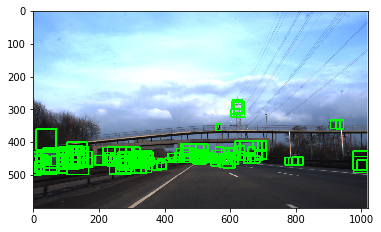

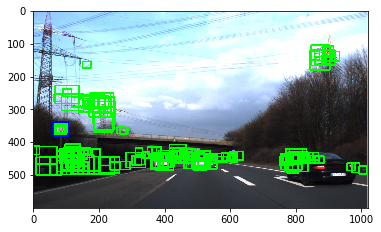

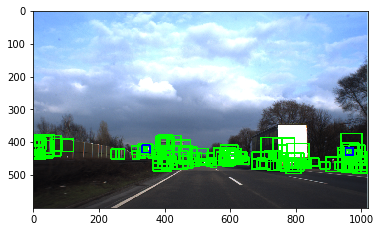

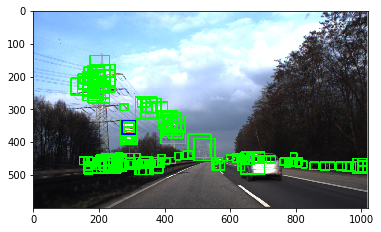

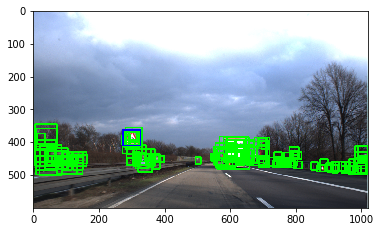

...

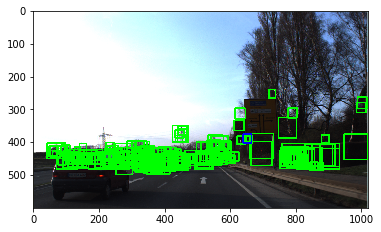

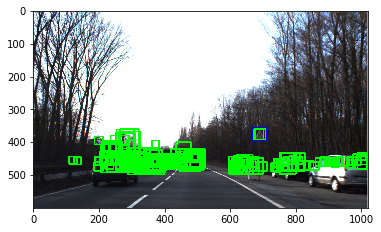

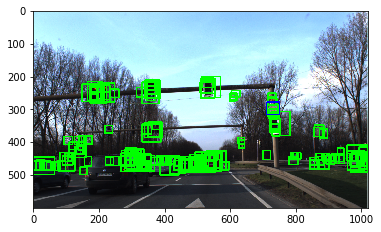

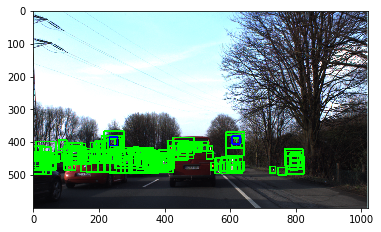

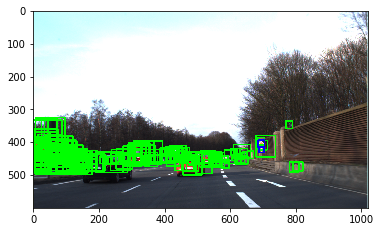

In [18]:
counter = 0
for filename in test_images:
    # Draw predictions
    aux = test_images.get(filename)[0].copy()
    for bbox in test_pred.get(filename)[0]:
        x_up,y_up,x_down,y_down = bbox[0], bbox[1], bbox[2], bbox[3]
        width = x_down - x_up
        height  = y_down - y_up
        ratio = height/width
        size = height*width
        if (ratio <= 0.75 or ratio >= 1.33) or (size >= 75**2) or (y_up <= 100 or y_down >= 500):
            continue #descartar imagen
        cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (0,255,0), 3)
    # Draw ground truth
    if filename in test_files:
        for idx in [i for i, x in enumerate(test_files) if x == filename]:
            bbox = test_bboxes[idx]
            cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (255,0,0), 3)
    plt.imshow(cv2.cvtColor(aux, cv2.COLOR_BGR2RGB))
    plt.show()
    
    counter += 1
    if counter > 10:
        break

# Traffic Sign detection

We suggest you train a “detector” CNN that determines whether a region proposal is a
traffic sign. Then use your traffic sign classification net to obtain the actual class. This is
not the only approach to the problem, perhaps not even a good one. Feel free to follow
your own thoughts. Bear in mind that both accuracy, in terms of mAP, and running time
should be optimized in your solution. So, ideas to improve your classification performance
or speed-up the detection process, e.g. , e.g. use non-maximum-supression, some clever
region proposal filter, etc... will make a difference


### Preprocessing of the images

In [ ]:
!pip install Pillow

In [19]:
# example of brighting image augmentation
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

augmented_tr_signs = []
augmented_tr_labels = []

Using TensorFlow backend.


**Data augmentation**: three images with different brightness and two more with rotation changes (Only 10 degrees)

1 of 600
2 of 600
3 of 600
4 of 600
5 of 600
6 of 600
7 of 600
8 of 600
9 of 600


/jet/var/python/lib/python3.6/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


10 of 600
11 of 600
12 of 600
13 of 600
14 of 600
15 of 600
16 of 600
17 of 600
18 of 600
19 of 600
20 of 600
21 of 600
22 of 600
23 of 600
24 of 600
25 of 600
26 of 600
27 of 600
28 of 600
29 of 600
30 of 600
31 of 600
32 of 600
33 of 600
34 of 600
35 of 600
36 of 600
37 of 600
38 of 600
39 of 600
40 of 600
41 of 600
42 of 600
43 of 600
44 of 600
45 of 600
46 of 600
47 of 600
48 of 600
49 of 600
50 of 600
51 of 600
52 of 600
53 of 600
54 of 600
55 of 600
56 of 600
57 of 600
58 of 600
59 of 600
60 of 600
61 of 600
62 of 600
63 of 600
64 of 600
65 of 600
66 of 600
67 of 600
68 of 600
69 of 600
70 of 600
71 of 600
72 of 600
73 of 600
74 of 600
75 of 600
76 of 600
77 of 600
78 of 600
79 of 600
80 of 600
81 of 600
82 of 600
83 of 600
84 of 600
85 of 600
86 of 600
87 of 600
88 of 600
89 of 600
90 of 600
91 of 600
92 of 600
93 of 600
94 of 600
95 of 600
96 of 600
97 of 600
98 of 600
99 of 600
100 of 600
101 of 600
102 of 600
103 of 600
104 of 600
105 of 600
106 of 600
107 of 600
108 of 600
1

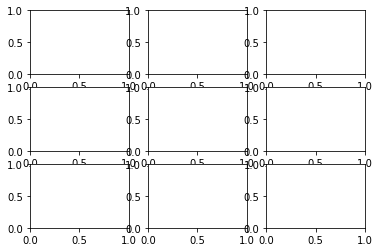

In [20]:
counter = 0

for sign in tr_signs:
    
    # Actual image
    label = tr_labels[counter]
    
    # First we add the actual one
    augmented_tr_signs.append(np.array(sign))
    augmented_tr_labels.append(label)
    
    # pyplot.imshow(sign)
    # pyplot.show()    
    
    # expand dimension to one sample
    samples = expand_dims(sign, 0)
    
    # create image data augmentation generator
    datagen = ImageDataGenerator(brightness_range=[0.1,0.9])

    # prepare iterator
    it = datagen.flow(samples, batch_size=1)

    # generate samples and plot
    for i in range(9):
        # define subplot
        pyplot.subplot(330 + 1 + i)
        # generate batch of images
        batch = it.next()
        # convert to unsigned integers for viewing
        image = batch[0].astype('float32')
        
        image = np.array(image) / 255
        
        # Adding the image with the label
        augmented_tr_signs.append(image)
        augmented_tr_labels.append(label)
        
        # plot raw pixel data
        # pyplot.imshow(image)
    # show the figure
    # pyplot.show()
    
    # Rotate to the left (10 degrees)
    rotation_matrix_left = cv2.getRotationMatrix2D((SIGN_SIZE[0]/2, SIGN_SIZE[1]/2), 10, 1)
    rotated_image_left = cv2.warpAffine(sign,rotation_matrix_left,(SIGN_SIZE[0], SIGN_SIZE[1]))
    
    augmented_tr_signs.append(rotated_image_left)
    augmented_tr_labels.append(label)
    
    # Rotate to the left (5 degrees)
    rotation_matrix_left = cv2.getRotationMatrix2D((SIGN_SIZE[0]/2, SIGN_SIZE[1]/2), 5, 1)
    rotated_image_left = cv2.warpAffine(sign,rotation_matrix_left,(SIGN_SIZE[0], SIGN_SIZE[1]))
    
    augmented_tr_signs.append(rotated_image_left)
    augmented_tr_labels.append(label)
    
    # plot raw pixel data
    # pyplot.imshow(rotated_image_left)
    
    # Rotate to the right (10 degrees)
    rotation_matrix_rigth=cv2.getRotationMatrix2D((SIGN_SIZE[0]/2, SIGN_SIZE[1]/2), -10, 1)
    rotated_image_right=cv2.warpAffine(sign,rotation_matrix_rigth,(SIGN_SIZE[0], SIGN_SIZE[1]))
    
    augmented_tr_signs.append(rotated_image_right)
    augmented_tr_labels.append(label)
    
    # Rotate to the right (5 degrees)
    rotation_matrix_rigth=cv2.getRotationMatrix2D((SIGN_SIZE[0]/2, SIGN_SIZE[1]/2), -5, 1)
    rotated_image_right=cv2.warpAffine(sign,rotation_matrix_rigth,(SIGN_SIZE[0], SIGN_SIZE[1]))
    
    augmented_tr_signs.append(rotated_image_right)
    augmented_tr_labels.append(label)
    
    # plot raw pixel data
    # pyplot.imshow(rotated_image_right)
    
    # show the figure
    # pyplot.show()
    
    print (str(counter + 1) + " of 600")
    counter = counter + 1

**Changing RGB to gray scale**

Although validation and test data need to be processed in the same way to fit the neural network in the final steps.

In [71]:
# def gray_scale(image): 
#     return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# 
# augmented_gray_tr_signs =  []
# gray_va_signs = []
# gray_te_signs = []

# for augmented_tr_sign in augmented_tr_signs:
#     augmented_gray_tr_signs.append(gray_scale(augmented_tr_sign).reshape(224,224,1))

# for va_sign in va_signs:
#     gray_va_signs.append(gray_scale(va_sign).reshape(224,224,1))
    
# for te_sign in te_signs:
#     gray_te_signs.append(gray_scale(te_sign).reshape(224,224,1))

In [15]:
# def show_4_images(images):
#     counter = 0
#     for image in images:
#        if counter <= 4:
#            pyplot.imshow(image.reshape(224, 224), cmap=plt.get_cmap('gray'), vmin=0, vmax=1)
#            pyplot.show()
#       else:
#            return
#        counter = counter + 1

 ### Original


In [21]:
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, LeakyReLU
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AveragePooling2D
from tensorflow.keras import optimizers
from time import time

num_classes = 43

def sign_classiffier():
    input_shape = (SIGN_SIZE[0], SIGN_SIZE[1],3)

    model = Sequential()
    model.add(Conv2D(16, kernel_size=(3, 3), padding='same', input_shape=input_shape))
    model.add(Activation('relu'))

    model.add(Conv2D(32, strides=(2, 2), kernel_size=(3, 3), padding='same'))
    model.add(Activation('relu'))
    model.add(Dropout(0.2))

    model.add(MaxPooling2D(pool_size=(2,2)))

    model.add(Conv2D(64, strides=(2, 2), kernel_size=(3, 3), padding='same'))
    model.add(Activation('relu'))
    #
    model.add(Dropout(0.2))

    model.add(Conv2D(64, strides=(2, 2), kernel_size=(3, 3), padding='same'))
    model.add(Activation('relu'))
    # 
    model.add(Dropout(0.2))

    model.add(Conv2D(128, strides=(2, 2), kernel_size=(3, 3), padding='same'))
    model.add(Activation('relu'))
    #
    model.add(Dropout(0.2))

    model.add(Conv2D(128, strides=(2, 2), kernel_size=(3, 3), padding='same'))
    model.add(Activation('relu'))
    #
    model.add(Dropout(0.2))

    model.add(Flatten())
    model.add(Activation('relu'))

    model.add(Dense(num_classes*8))
    model.add(BatchNormalization())

    model.add(Dense(num_classes*4))
    model.add(BatchNormalization())

    model.add(Dense(num_classes))
    model.add(Activation('softmax'))

    # opt = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])
    model.summary()
    return model

In [22]:
tr_signs = np.array(augmented_tr_signs)
va_signs = np.array(va_signs)
te_signs = np.array(te_signs)

tr_labels = np.array(augmented_tr_labels)
va_labels = np.array(va_labels)
te_labels = np.array(te_labels)

In [23]:
# Checking if it is well divided
print("| tr_images: " + str(tr_signs.shape) + " | " + "tr_labels: " + str(tr_labels.shape) + " |")
print("| va_images: " + str(va_signs.shape) + "  | " + "va_labels: " + str(va_labels.shape) + "  |")
print("| te_images: " + str(te_signs.shape) + "  | " + "te_labels: " + str(te_labels.shape) + "  |")

| tr_images: (8400, 224, 224, 3) | tr_labels: (8400, 43) |
| va_images: (252, 224, 224, 3)  | va_labels: (252, 43)  |
| te_images: (361, 224, 224, 3)  | te_labels: (361, 43)  |


In [24]:
model = sign_classiffier()
model.fit(tr_signs,tr_labels,
        batch_size=30,
        epochs=5,
        verbose=1,
        validation_data=(va_signs, va_labels))

loss, acc = model.evaluate(te_signs, te_labels, verbose=1)
print('Test loss: ' + str(loss) + ' - Accuracy: ' + str(acc))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 16)      448       
_________________________________________________________________
activation_80 (Activation)   (None, 224, 224, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 32)      4640      
_________________________________________________________________
activation_81 (Activation)   (None, 112, 112, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 112, 112, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 56, 56, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 28, 28, 64)        18496     
__________

In [25]:
model.save("signal_classifier_ANN.hdf5")

### Evaluation using Mean Average Precision

To evaluate your model you should use `https://github.com/Cartucho/mAP`. Following
the guidelines of the mAP code we store the ground truth bboxes and labels in
`mAP/input/ground-truth/`. Your results are stored in `mAP/input/detection-results/`. Note that in our code
sign_class represents the predicted traffic sign label, confidence the confidence that
the bbox has a traffic sign, and `bbox[...]` are the bbox co-ordinates.

In [24]:
# Download the evaluation repository
!rm -rf mAP
!git clone https://github.com/Cartucho/mAP.git
! cd mAP && git checkout 92e6d334c903ab795fdae15d1a45730d768b4c08 && cd ..
# Create the directories
!rm -rf mAP/input/ground-truth
!mkdir -p mAP/input/ground-truth
!rm -rf mAP/input/detection-results
!mkdir -p mAP/input/detection-results

Cloning into 'mAP'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 894 (delta 4), reused 10 (delta 2), pack-reused 880
Receiving objects: 100% (894/894), 14.72 MiB | 28.27 MiB/s, done.
Resolving deltas: 100% (308/308), done.
Note: checking out '92e6d334c903ab795fdae15d1a45730d768b4c08'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at 92e6d33... Merge branch 'NH1922-master'


In [26]:
for filename in test_images:
    anns_ofs = open('mAP/input/ground-truth/' + filename[-9:-4:] + '.txt', 'w')
    if filename in test_files:
        for idx in [i for i, x in enumerate(test_files) if x == filename]:
            bbox = test_bboxes[idx]
            label = test_labels[idx]
            anns_ofs.write(str(label) + ' ' + str(bbox[0]) + ' ' + str(bbox[1]) + ' ' + str(bbox[2]) + ' ' + str(bbox[3]) + '\n')
    anns_ofs.close()

In [27]:
import pandas as pd

count = 0
data = []
for filename in test_images:
    for bbox in test_pred.get(filename)[0]:
        a,b,c,d = bbox[0], bbox[1], bbox[2], bbox[3]
        width = c - a
        height  = d - b
        size = height*width
        dictionary = {"filename": filename ,
                      "height" : height, 
                      "width" : width, 
                      "ratio" : height/width, 
                      "size" : size,
                      "x_up" : a,
                      "y_up" : b,
                      "x_down" : c,
                      "y_down" : d                           
                     }
        data.append(dictionary)
df = pd.DataFrame(data)

In [28]:
filtered = df.where((df["ratio"] >= 0.75) &
                    (df["ratio"] <= 1.33) &
                    (df["size"] <= 75*75) &
                    (df["y_up"] >= 100) &
                    (df["y_down"] <= 500)
                    )
filtered.describe()

,height,ratio,size,width,x_down,x_up,y_down,y_up
count,45903.000000,45903.000000,45903.000000,45903.000000,45903.000000,45903.000000,45903.000000,45903.000000
mean,33.985738,1.008704,1360.080657,34.276807,508.791369,474.514563,404.751334,370.765597
std,14.380070,0.163484,1185.150696,14.781298,267.453818,267.120541,65.792708,66.455910
min,12.337646,0.750011,171.504135,13.369141,16.938766,0.000000,122.126274,100.210342
25%,23.345886,0.867432,546.615723,23.238434,296.649033,266.531509,374.531967,340.507721
50%,28.095398,0.993178,780.487366,28.363525,502.071777,471.096527,409.309082,376.183960
75%,43.898926,1.142061,2029.996704,45.123169,706.201782,670.721191,457.241119,424.577682
max,85.368164,1.329964,5620.585449,84.721184,1020.000000,995.895142,499.993439,479.545410


### Loading neural networks

In [29]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras import optimizers

def background_detector():
    num_classes = 1
    input_shape = (SIGN_SIZE[0], SIGN_SIZE[1], 3)

    background_model = Sequential()

    background_model.add(Conv2D(32, 3, 3, border_mode='same', input_shape=input_shape, activation='relu'))

    # model.add(Conv2D(32, 3, 3, border_mode='same', activation='relu'))
    # model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2))

    background_model.add(Conv2D(64, 3, 3, border_mode='same', activation='relu'))
    # model.add(Conv2D(64, 3, 3, border_mode='same', activation='relu'))
    background_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    background_model.add(Conv2D(128, 3, 3, border_mode='same', activation='relu'))
    # model.add(Conv2D(128, 3, 3, border_mode='same', activation='relu'))
    background_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    background_model.add(Conv2D(256, 3, 3, border_mode='same', activation='relu'))
    # model.add(Conv2D(256, 3, 3, border_mode='same', activation='relu'))

    background_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    background_model.add(Flatten())
    background_model.add(Dense(256, activation='relu'))
    background_model.add(Dropout(0.5))

    background_model.add(Dense(128, activation='relu'))
    background_model.add(Dropout(0.5))

    background_model.add(Dense(1))
    background_model.add(Activation('sigmoid'))

    # opt = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
    background_model.compile(loss='binary_crossentropy', optimizer="Adam", metrics=['accuracy'])
    background_model.summary()
    return background_model

In [21]:
!pip install dill

    100% |████████████████████████████████| 153kB 4.1MB/s ta 0:00:01
  Running setup.py bdist_wheel for dill ... done
  Stored in directory: /jet/.cache/pip/wheels/59/b1/91/f02e76c732915c4015ab4010f3015469866c1eb9b14058d8e7
Successfully built dill
You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


TypeError: can't pickle SwigPyObject objects

In [30]:
import os
def final_classification(params, model, background_model):
    start = time()

    for filename in test_images:
        # Open the file where we are going to write the results
        path = 'mAP/input/detection-results/' + params["folder_name"] + '/' 
        file = filename[-9:-4:] + '.txt'
        if not os.path.exists(path):
            os.makedirs(path)
        prds_ofs = open(path + file, 'w')
        print("Writing results to \"mAP/input/detection-results/{}/{}\"".format(path,file))

        # For Non Maximum Suppression
        SCORE_THRESHOLD = params['SCORE_THRESHOLD']
        IOU_THRESHOLD = params['IOU_THRESHOLD']
        boxes_NMS = []
        confidences_NMS = []
        value_needed_NMS = []

        sign_logits_list = []

        # For each candidate bounding box in the image
        for bbox in test_pred.get(filename)[0]:
            # Crop the Region Of Interest (ROI) from the original image
            roi = test_images.get(filename)[0][int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
            roi_resized = cv2.resize(roi, SIGN_SIZE)
            roi_resized = roi_resized.astype('float32')
            roi_resized /= 255.0
            roi_resized = np.array([roi_resized])

            #########################################################################################

            #TODO: Implement here your smart strategy to select the best bounding boxes. For example:

            #Proportion of boxes
            x_up,y_up,x_down,y_down = bbox[0], bbox[1], bbox[2], bbox[3]
            width = x_down - x_up
            height  = y_down - y_up
            ratio = height/width
            size = height*width
            if (ratio <= params['box_ratio'] or ratio >= 1/params['box_ratio']) or (size >= params['box_size']) or (y_up <= params['pixels_borders'] or y_down >= 600 - params['pixels_borders']):
                continue #descartar imagen

            # Background detector
            background_results = background_model.predict(roi_resized)

            if(background_results[0][0] < params['background_prob']):
                continue # descartar imagen

            # Run your own detector and save each traffic sign classification
            sign_logits = model.predict(roi_resized).flatten()
            sign_logits_list.append(sign_logits.max())        

            # Skip predictions with small confidence
            if sign_logits.max() < params['clf_confidence']:
                continue # descartar imagen

            # If is a box useful, we store it in order to apply non_maximum_suppression
            boxes_NMS.append(bbox)
            confidences_NMS.append(float(sign_logits.max()))
            value_needed_NMS.append(str(np.argmax(sign_logits)))

            #########################################################################################

        # Now, we can apply to the boxes the non maximum suppression    
        idxs = cv2.dnn.NMSBoxes(boxes_NMS,
                                confidences_NMS,
                                SCORE_THRESHOLD,
                                IOU_THRESHOLD)

        for idx in idxs:
            # Save the results for evaluation
            prds_ofs.write(value_needed_NMS[idx[0]] + ' ' + str(confidences_NMS[idx[0]]) + ' ' + str(boxes_NMS[idx[0]][0]) + ' ' + str(boxes_NMS[idx[0]][1]) + ' ' + str(boxes_NMS[idx[0]][2]) + ' ' + str(boxes_NMS[idx[0]][3]) + '\n')
        prds_ofs.close()

    end = time()
    print("Traffic sign detection took " + str(end - start) + " seconds")
    return str(end - start) + " seconds"

In [32]:
# Load the neural networks weights
# signal_classifier = keras.models.load_model("signal_classifier_ANN.hdf5") 
# signal_model = sign_classiffier()
# signal_model.load_weights("signal_classifier_ANN.hdf5")
background_model = keras.models.load_model("background_detector_ANN.hdf5")

In [ ]:
#Default
params['SCORE_THRESHOLD'] = 0.5
params['IOU_THRESHOLD'] = 0.5
params['box_ratio'] = 0.75
params['box_size'] = 75*75
params['pixels_borders'] = 100
params['clf_confidence'] = 0.9

In [1]:
# score_thresholds = [0.1, 0.2]
iou_thresholds = [0.5]
box_ratios = [0.65, 0.75]
box_sizes = [90*90]
pixels_borders = [100]
clf_confidences = [0.1,0.2]
background_prob = [0.7, 0.8]

count = 0
configurations = []
for x2 in iou_thresholds:
    for x3 in box_ratios:
        for x4 in box_sizes:
            for x5 in pixels_borders:
                for x6 in clf_confidences:
                    for x7 in background_prob:
                        params = {"SCORE_THRESHOLD" : x6,
                                    "IOU_THRESHOLD" : x2,
                                  "box_ratio"       : x3,
                                  "box_size"        : x4,
                                  "pixels_borders"  : x5,
                                  "clf_confidence"  : x6,
                                  "background_prob" : x7,
                                  "folder_name" : "final_config_{}".format(count) 
                                 }
                        configurations.append(params)
                        count += 1
                        

In [45]:
len(configurations)

8

In [46]:
count = 0
for params in configurations:
    time_threshold = final_classification(params, model, background_model)
    params["time"] = time_threshold
    count += 1
    print(count)
    print(params)

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00600.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00601.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00602.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00603.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00604.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00605.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00606.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00607.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00608.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00680.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00681.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00682.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00683.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00684.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00685.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00686.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00687.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00688.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00760.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00761.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00762.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00763.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00764.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00765.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00766.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00767.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00768.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00840.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00841.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00842.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00843.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00844.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00845.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00846.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00847.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_0//00848.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00617.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00618.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00619.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00620.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00621.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00622.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00623.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00624.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00625.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00697.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00698.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00699.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00700.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00701.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00702.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00703.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00704.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00705.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00777.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00778.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00779.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00780.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00781.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00782.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00783.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00784.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00785.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00857.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00858.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00859.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00860.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00861.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00862.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00863.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00864.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_1//00865.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00634.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00635.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00636.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00637.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00638.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00639.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00640.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00641.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00642.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00714.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00715.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00716.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00717.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00718.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00719.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00720.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00721.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00722.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00794.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00795.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00796.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00797.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00798.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00799.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00800.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00801.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00802.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00874.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00875.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00876.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00877.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00878.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00879.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00880.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00881.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_2//00882.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00651.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00652.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00653.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00654.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00655.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00656.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00657.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00658.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00659.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00731.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00732.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00733.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00734.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00735.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00736.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00737.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00738.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00739.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00811.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00812.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00813.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00814.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00815.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00816.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00817.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00818.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00819.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00891.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00892.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00893.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00894.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00895.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00896.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00897.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00898.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_3//00899.txt"
Traffic sign detection took 664.9571030139923 seconds
4
{'SCORE_THRESHOLD

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00668.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00669.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00670.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00671.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00672.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00673.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00674.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00675.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00676.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00748.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00749.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00750.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00751.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00752.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00753.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00754.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00755.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00756.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00828.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00829.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00830.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00831.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00832.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00833.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00834.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00835.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_4//00836.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00605.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00606.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00607.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00608.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00609.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00610.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00611.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00612.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00613.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00685.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00686.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00687.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00688.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00689.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00690.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00691.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00692.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00693.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00765.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00766.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00767.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00768.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00769.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00770.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00771.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00772.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00773.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00845.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00846.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00847.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00848.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00849.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00850.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00851.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00852.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_5//00853.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00622.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00623.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00624.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00625.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00626.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00627.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00628.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00629.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00630.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00702.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00703.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00704.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00705.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00706.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00707.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00708.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00709.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00710.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00782.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00783.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00784.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00785.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00786.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00787.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00788.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00789.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00790.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00862.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00863.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00864.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00865.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00866.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00867.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00868.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00869.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_6//00870.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00639.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00640.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00641.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00642.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00643.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00644.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00645.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00646.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00647.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00719.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00720.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00721.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00722.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00723.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00724.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00725.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00726.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00727.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00799.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00800.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00801.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00802.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00803.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00804.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00805.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00806.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00807.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00879.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00880.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00881.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00882.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00883.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00884.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00885.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00886.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/final_config_7//00887.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-resul

In [4]:
%ls mAP

input/  LICENSE  main.py  README.md  results/  scripts/


In [5]:
#config_names = ["config_{}".format(i) for i in range(2)]
configs_and_results = []
for c in configurations:
    print(c["folder_name"])
    print(c)
    result = !python mAP/main.py -na -np -q -f {c["folder_name"]}
    print(result)
    c["result"]  = float(result[0][6:-1])
    configs_and_results.append(c)

final_config_0
{'SCORE_THRESHOLD': 0.1, 'IOU_THRESHOLD': 0.5, 'box_ratio': 0.65, 'box_size': 8100, 'pixels_borders': 100, 'clf_confidence': 0.1, 'background_prob': 0.7, 'folder_name': 'final_config_0'}
['mAP = 24.92%']
final_config_1
{'SCORE_THRESHOLD': 0.1, 'IOU_THRESHOLD': 0.5, 'box_ratio': 0.65, 'box_size': 8100, 'pixels_borders': 100, 'clf_confidence': 0.1, 'background_prob': 0.8, 'folder_name': 'final_config_1'}
['mAP = 24.96%']
final_config_2
{'SCORE_THRESHOLD': 0.2, 'IOU_THRESHOLD': 0.5, 'box_ratio': 0.65, 'box_size': 8100, 'pixels_borders': 100, 'clf_confidence': 0.2, 'background_prob': 0.7, 'folder_name': 'final_config_2'}
['mAP = 24.92%']
final_config_3
{'SCORE_THRESHOLD': 0.2, 'IOU_THRESHOLD': 0.5, 'box_ratio': 0.65, 'box_size': 8100, 'pixels_borders': 100, 'clf_confidence': 0.2, 'background_prob': 0.8, 'folder_name': 'final_config_3'}
['mAP = 24.96%']
final_config_4
{'SCORE_THRESHOLD': 0.1, 'IOU_THRESHOLD': 0.5, 'box_ratio': 0.75, 'box_size': 8100, 'pixels_borders': 100, 'c

In [36]:
params_best = {
          "SCORE_THRESHOLD" : 0.1,
          "IOU_THRESHOLD"   : 0.5,
          "box_ratio"       : 0.75,
          "box_size"        : 90*90,
          "pixels_borders"  : 100,
          "clf_confidence"  : 0.1,
          "folder_name"     : "params_best",
          "background_prob" : 0.8
         }
params_best["time"] = final_classification(params_best, model, background_model)

Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00600.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00601.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00602.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00603.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00604.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00605.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00606.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00607.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00608.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00609.txt"


Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00682.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00683.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00684.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00685.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00686.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00687.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00688.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00689.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00690.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00691.txt"


Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00764.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00765.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00766.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00767.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00768.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00769.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00770.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00771.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00772.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00773.txt"


Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00846.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00847.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00848.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00849.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00850.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00851.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00852.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00853.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00854.txt"
Writing results to "mAP/input/detection-results/mAP/input/detection-results/params_best//00855.txt"


In [37]:
%cd -q mAP
! python main.py -na -np -f params_best
%cd -q ..

25.92% = 1 AP 
28.99% = 10 AP 
25.00% = 11 AP 
33.77% = 12 AP 
36.64% = 13 AP 
81.97% = 14 AP 
40.00% = 15 AP 
0.00% = 16 AP 
75.00% = 17 AP 
32.20% = 18 AP 
54.55% = 2 AP 
25.00% = 22 AP 
23.81% = 23 AP 
0.00% = 24 AP 
16.67% = 25 AP 
0.00% = 26 AP 
38.57% = 28 AP 
0.00% = 29 AP 
11.11% = 3 AP 
50.00% = 30 AP 
0.00% = 31 AP 
0.00% = 32 AP 
55.56% = 33 AP 
23.33% = 34 AP 
50.00% = 35 AP 
0.00% = 36 AP 
0.00% = 37 AP 
51.25% = 38 AP 
0.00% = 39 AP 
21.62% = 4 AP 
0.00% = 40 AP 
0.00% = 41 AP 
0.00% = 42 AP 
3.12% = 5 AP 
0.00% = 6 AP 
75.00% = 7 AP 
10.00% = 8 AP 
68.46% = 9 AP 
mAP = 25.20%


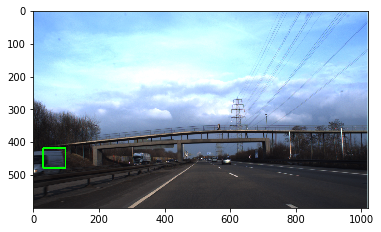

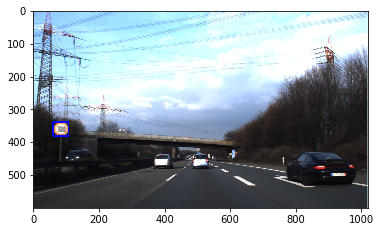

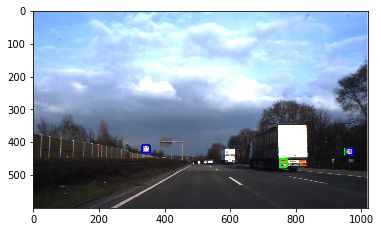

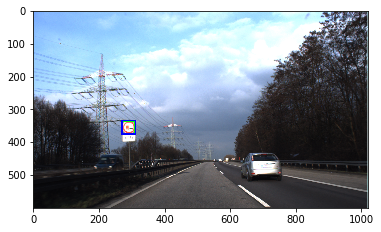

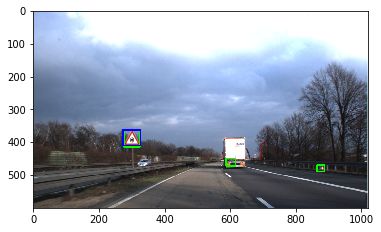

...

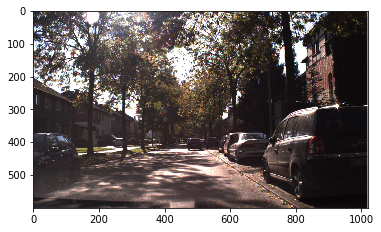

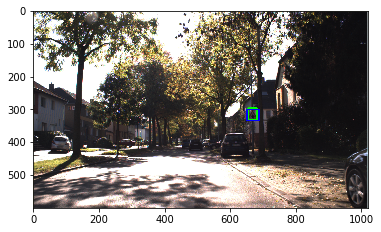

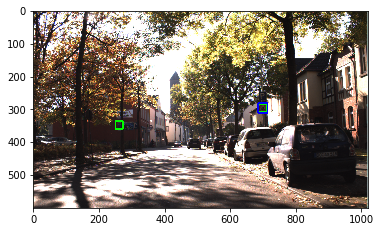

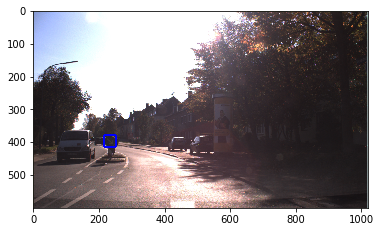

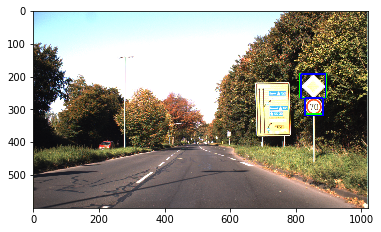

In [38]:
import matplotlib.pyplot as plt

counter = 0
for filename in test_images:
    aux = test_images.get(filename)[0].copy()
    txt_filename = open('mAP/input/detection-results/params_best/' + filename[-9:-4:] + '.txt', 'r')
    f = open(txt_filename.name, "r")
    # Draw predictions
    for line in f.readlines():
        chunks = line.split(' ')
        class_id, confidence = int(chunks[0]), float(chunks[1])
        bb_left, bb_top, bb_right, bb_bottom = float(chunks[2]), float(chunks[3]), float(chunks[4]), float(chunks[5])
        cv2.rectangle(aux, (int(bb_left), int(bb_top)), (int(bb_right), int(bb_bottom)), (0,255,0), 3)
    f.close()
    
    # Draw ground truth
    if filename in test_files:
        for idx in [i for i, x in enumerate(test_files) if x == filename]:
            bbox = test_bboxes[idx]
            cv2.rectangle(aux, (int(bbox[0]),int(bbox[1])), (int(bbox[2]),int(bbox[3])), (255,0,0), 3)
    plt.imshow(cv2.cvtColor(aux, cv2.COLOR_BGR2RGB))
    plt.show()
    
    counter += 1
    if counter > 40:
        break

In [81]:
import pandas as pd

In [9]:
pd.DataFrame(configs_and_results).sort_values("result", ascending = False)

,IOU_THRESHOLD,SCORE_THRESHOLD,background_prob,box_ratio,box_size,clf_confidence,folder_name,pixels_borders,result
4,0.5,0.1,0.7,0.75,8100,0.1,final_config_4,100,25.35
6,0.5,0.2,0.7,0.75,8100,0.2,final_config_6,100,25.35
5,0.5,0.1,0.8,0.75,8100,0.1,final_config_5,100,25.20
7,0.5,0.2,0.8,0.75,8100,0.2,final_config_7,100,25.20
1,0.5,0.1,0.8,0.65,8100,0.1,final_config_1,100,24.96
3,0.5,0.2,0.8,0.65,8100,0.2,final_config_3,100,24.96
0,0.5,0.1,0.7,0.65,8100,0.1,final_config_0,100,24.92
2,0.5,0.2,0.7,0.65,8100,0.2,final_config_2,100,24.92
